In [1]:
from getpass import getuser # Libaray to copy things
from pathlib import Path # Object oriented libary to deal with paths
from tempfile import NamedTemporaryFile, TemporaryDirectory # Creating temporary Files/Dirs

import xarray as xr
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from pathlib import Path
import netCDF4 as nc

# for plot
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import dask

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


# PLOTTING TOOL

In [2]:
def contf_tmean(title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max):
    proj = ccrs.PlateCarree(central_longitude=0.0) # Create Mollweide projections
    fig = plt.figure(figsize=(18, 12))
    ax = fig.add_subplot(111, projection=proj)
    ax.set_extent([lon_min+5,lon_max-5,lat_min+5,lat_max-5])
    #plot = data.where((data.lat >= lat_min) & (data.lat <= lat_max) & (data.lon >= lon_min) & (data.lon <= lon_max)).plot(
    plot = data.plot(
                      ax=ax,
                      transform=ccrs.PlateCarree(),
                      cmap=colormap,
                      vmin=varmin,
                      vmax=varmax,
                     # cbar_kwargs={'label': 'Surface Temperature [K]',
                     #              'extend': 'both',
                     #              'shrink': .5,
                     #              'orientation': 'horizontal'},
                      add_colorbar=False
                     )
    bounds = np.linspace(varmin,varmax, space)
    cb = plt.colorbar(plot, orientation="horizontal", fraction=0.05, pad=0.10, extend='both',ticks=bounds, boundaries=bounds)
    cb.set_label(label=label, size=15, weight='bold')
    cb.ax.tick_params(labelsize=15)
    cb.ax.set_xticklabels(bounds,rotation=90)
    ax.coastlines(resolution='10m', lw=0.51)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style, gl.ylabel_style = {'fontsize': 15}, {'fontsize': 15}
    ax.yaxis.tick_right() 
    ax.set_title(title, y=1.1, fontsize=20, weight='bold')
    _ = fig.subplots_adjust(left=0.01, right=0.98, hspace=0, wspace=0, top=0.9, bottom=0.25)

# Precipitation

## Load interpolated ICON results

In [24]:
path_icon =Path('/scratch/m/m300948/test_04/')
glob_pattern = 'test_daily_pr_2020'
file_icon = sorted([str(f) for f in path_icon.glob(f'{glob_pattern}*.nc')])[:]

In [25]:
var = 'pr'
dset_icon = xr.open_mfdataset(file_icon,parallel=True)[var].chunk({'time':24})

In [ ]:
dset_icon

## Load IMERGE 

### Loading IMERGE for every time takes a lot of time, so save ncfile at initial point

#### 1. save ncfile for daily basis at the initial step - /work/mh0731/from_Mistral/mh0731/m300876/precip_paper/data/obs/IMERG

In [ ]:
def halfhourly_to_daily(year,month):
    glob_pattern_3d1 = 'IMERG_precipitationrate__V06B__halfhourly__0.1degree__'+ year+month
    data_path1 = Path('/pool/data/ICDC/atmosphere/imerg/DATA/' + year)
    file_names1 = sorted([str(f) for f in data_path1.rglob(f'*{glob_pattern_3d1}*.nc')])[:]
    pr_imerg  = xr.open_mfdataset(file_names1,engine='netcdf4',combine='by_coords').sel(lat=slice(-30,30))
    pr_imerg_day = pr_imerg['calibrated_precipitation'].chunk({'time':144}).resample(time='1D').sum() /2
    pr_imerg_day.to_netcdf('/scratch/m/m300876/data/imerg/IMERG_precipitationrate_V06B_daily_0.1degree_tropics_30S_30N_'+year+month+'.nc', format = 'NETCDF4', mode ='w', group=None)
    #pr_imerg_day_trop.to_netcdf('/work/mh0731/m300876/precip_paper/data/obs/IMERG/IMERG_precipitationrate_V06B_daily_0.1degree_tropics_30S_30N_'+year+'.nc', format = 'NETCDF4', mode ='w', group=None)
    return print('work done')

In [ ]:
##running
halfhourly_to_daily('2021','01')

#### 2. load IMERGE for everytime when I run this script (unefficient)

In [ ]:
path_imerg =Path('/pool/data/ICDC/atmosphere/imerg/DATA/2020')
glob_pattern = 'IMERG_precipitationrate__V06B__halfhourly__0.1degree__2020'
file_img = sorted([str(f) for f in path_imerg.glob(f'{glob_pattern}*.nc')])[:]

In [ ]:
# 2020.01.20.00:00 - 2020.03.31.23:30 24*182-1
file_img_date=file_img[24*38:24*182-1]
var = 'calibrated_precipitation'

# dask: not actually upload data, but shows the information of the data and get chucks which enable to calculate parallely
# for open_mfdataset, it needs dask 
# dsetvar = xr.open_mfdataset(file_img_date,parallel=True)[var] #default= by_coords, otherwise "nested" (but in case of nested, you need to indicate 'concat_dim')
# As a default, it chunks the data following different criteria (here since data is aligned with time, it chunks according to the time), but it will be the best to chunk the data which is not (or less) modified
dset_imerge = xr.open_mfdataset(file_img_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)

# after modifying data, if I want to upload in real then use [].load() 

In [ ]:
# in total, the real data has 83.4GiB, which is nearly 80% for the total amount of the data storage assigned to this jupyter.note
dset_imerge

#### 3. Load imerge of previously saved ncfile

In [49]:
# imerge for daily basis
file_img = '/work/mh0731/from_Mistral/mh0731/m300876/precip_paper/data/obs/IMERG/IMERG_precipitationrate_V06B_daily_0.1degree_tropics_30S_30N_2020.nc'
dset_img = xr.open_dataset(file_img)

In [50]:
dset_img

<xarray.Dataset>
Dimensions:                   (time: 366, lat: 600, lon: 3600)
Coordinates:
  * time                      (time) datetime64[ns] 2020-01-01 ... 2020-12-31
  * lat                       (lat) float32 -29.95 -29.85 -29.75 ... 29.85 29.95
  * lon                       (lon) float32 -179.9 -179.8 -179.8 ... 179.8 179.9
Data variables:
    calibrated_precipitation  (time, lat, lon) float32 ...

In [51]:
# select time range
dset_img_jfm = dset_img.sel(
    time=slice('2020-01-20', '2020-03-22'))

In [ ]:
dset_img_jfm

# Load NextGEMS Cycle 2

In [52]:
path_ngc = Path('/scratch/m/m300948/nextgem_cyc2')
glob_pattern = 'ngc2002_daily_pr_2020'
file_ngc2 = sorted([str(f) for f in path_ngc.glob(f'{glob_pattern}*.nc')])[:]

In [53]:
var = 'pr'
dset_ngc2 = xr.open_mfdataset(file_ngc2,parallel=True)[var].chunk({'time':24})

In [54]:
dset_ngc2

<xarray.DataArray 'pr' (time: 58, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(58, 600, 3600), dtype=float32, chunksize=(24, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-23
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

## ICON/IMERGE Select region (lat, lon)

### 1. temporal averaged

In [26]:
# icon
%time icon_timavg = dset_icon.mean("time").compute() # %time : show how much time takes for the uploading
# kg/m^2/s (mm/s) -> mm/day 
icon_timavg = icon_timavg*3600*24

CPU times: user 362 ms, sys: 594 ms, total: 955 ms
Wall time: 2.94 s


In [55]:
# IMERGE
%time imerge_timavg = dset_img_jfm.mean("time").compute()
# extract dataarray from the xarray first
imerge_timavg_data=imerge_timavg['calibrated_precipitation']

CPU times: user 156 ms, sys: 352 ms, total: 507 ms
Wall time: 589 ms


In [56]:
# NGC2
%time ngc2_timavg = dset_ngc2.mean("time").compute()
# kg/m^2/s (mm/s) -> mm/day 
ngc2_timavg = ngc2_timavg*3600*24

CPU times: user 353 ms, sys: 423 ms, total: 777 ms
Wall time: 2.41 s


### +) Monthly time average - save them for monthly mean

In [52]:
icon_timavg_mon = dset_icon.resample(time='1M').mean("time")
icon_timavg_mon = icon_timavg_mon*3600*24

In [81]:
imerge_timavg_mon = dset_img_jfm.resample(time='1M').mean("time")
imerge_timavg_mon_data=imerge_timavg_mon['calibrated_precipitation']

In [48]:
ngc2_timavg_mon = dset_ngc2.resample(time='1M').mean("time")
ngc2_timavg_mon = ngc2_timavg_mon*3600*24

### 2. Spatial averaged

In [47]:
# Whole tropical region
icon_spaiavg = dset_icon.mean(("lon", "lat"))
icon_spaiavg = icon_spaiavg*3600*24

# 90,180E region
icon_spaiavg_2itcz = dset_icon.sel(lon=slice(90,180)).mean(("lon", "lat"))
icon_spaiavg_2itcz = icon_spaiavg_2itcz*3600*24

# Amazon region
icon_spaiavg_amz = dset_icon.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))
icon_spaiavg_amz = icon_spaiavg_amz*3600*24

In [60]:
# Whole tropical region
imerge_spaiavg = dset_img_jfm.mean(("lon", "lat"))
# extract dataarray from the xarray first
imerge_spaiavg_data=imerge_spaiavg['calibrated_precipitation']

# 90-180E region
imerge_spaiavg_2itcz = dset_img_jfm.sel(lon=slice(90,180)).mean(("lon", "lat"))
imerge_spaiavg_2itcz_data = imerge_spaiavg_2itcz['calibrated_precipitation']

# Amazon region
imerge_spaiavg_amz = dset_img_jfm.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))
imerge_spaiavg_data_amz=imerge_spaiavg_amz['calibrated_precipitation']

In [58]:
# Whole tropical region
ngc2_spaiavg = dset_ngc2.mean(("lon", "lat"))
ngc2_spaiavg = ngc2_spaiavg*3600*24

# 90-180E region
ngc2_spaiavg_2itcz = dset_ngc2.sel(lon=slice(90,180)).mean(("lon", "lat"))
ngc2_spaiavg_2itcz = ngc2_spaiavg_2itcz*3600*24

# Amazon region
ngc2_spaiavg_amz = dset_ngc2.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))
ngc2_spaiavg_amz = ngc2_spaiavg_amz*3600*24

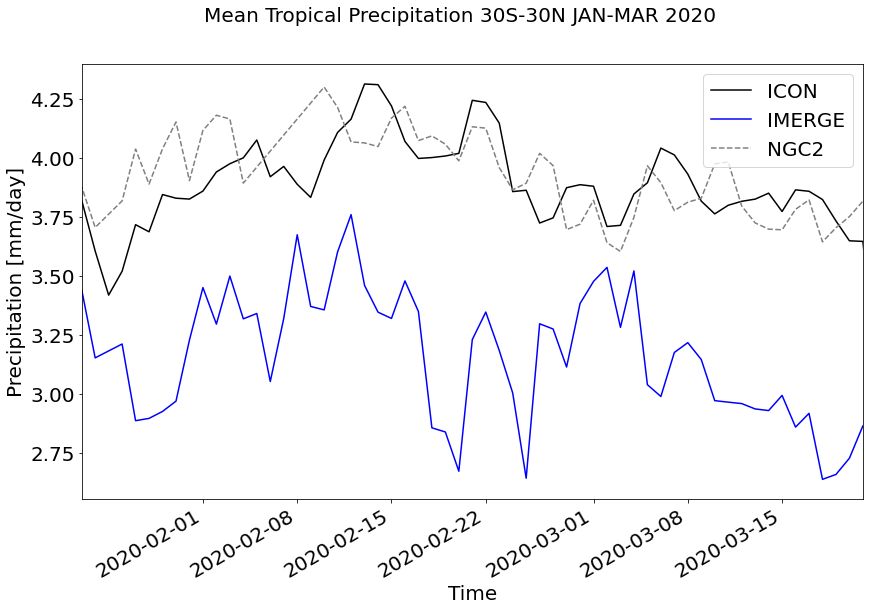

In [95]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Mean Tropical Precipitation 30S-30N JAN-MAR 2020', size=20)
icon_spaiavg.plot.line(label="ICON",c='black')
imerge_spaiavg_data.plot.line(label="IMERGE",c='blue')
ngc2_spaiavg.plot.line(label="NGC2",c='grey',ls='--')
plt.ylabel('Precipitation [mm/day]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
#plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

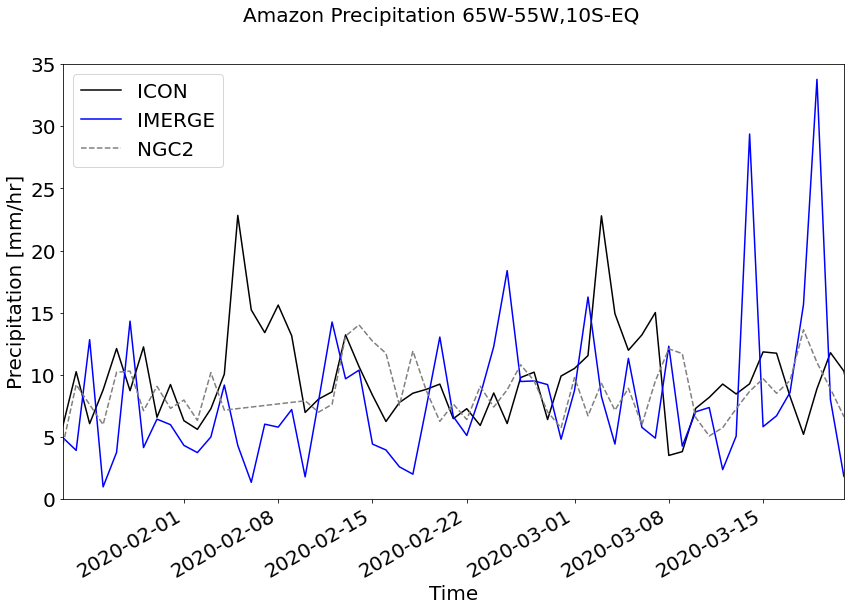

In [98]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Amazon Precipitation 65W-55W,10S-EQ', size=20)
icon_spaiavg_amz.plot.line(label="ICON",c='black')
imerge_spaiavg_data_amz.plot.line(label="IMERGE",c='blue')
ngc2_spaiavg_amz.plot.line(label="NGC2",c='grey',ls='--')
plt.ylabel('Precipitation [mm/hr]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

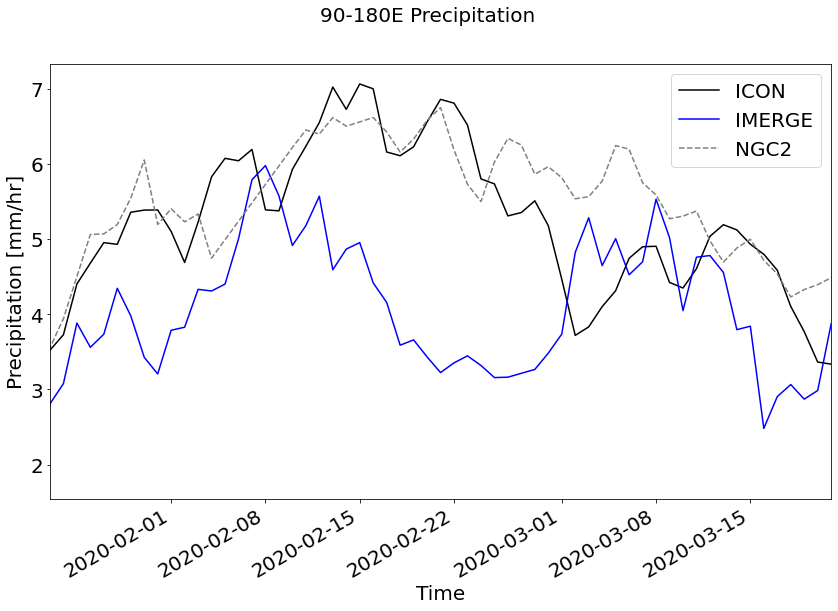

In [62]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('90-180E Precipitation', size=20)
icon_spaiavg_2itcz.plot.line(label="ICON",c='black')
imerge_spaiavg_2itcz_data.plot.line(label="IMERGE",c='blue')
ngc2_spaiavg_2itcz.plot.line(label="NGC2",c='grey',ls='--')
plt.ylabel('Precipitation [mm/hr]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
#plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# ICON RESULT

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'ICON precipitation',icon_timavg,'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

In [ ]:
icon_timavg_mon

In [ ]:
imerge_timavg_mon_data

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000']
for i in range(3):
    contf_tmean(f'ICON-IMERGE precipitation [mm/day]',icon_timavg_mon.sel(time=time_idx[i]),'Averaged Precipitation','RdYlBu_r',
    0, 10, 11,-30,30,-180,180)

# IMERGE RESULT

In [ ]:
contf_tmean(f'IMERG precipitation',imerge_timavg_data,'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

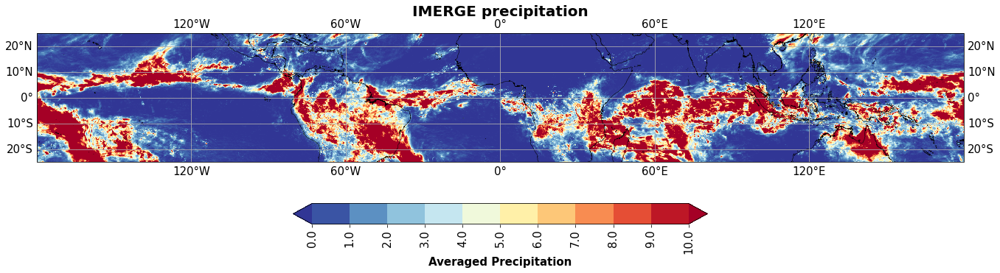

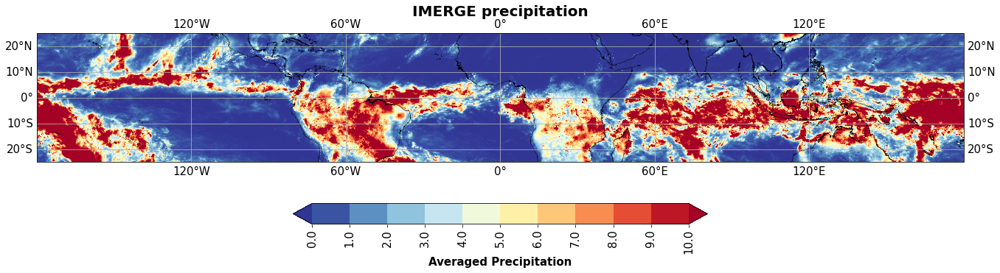

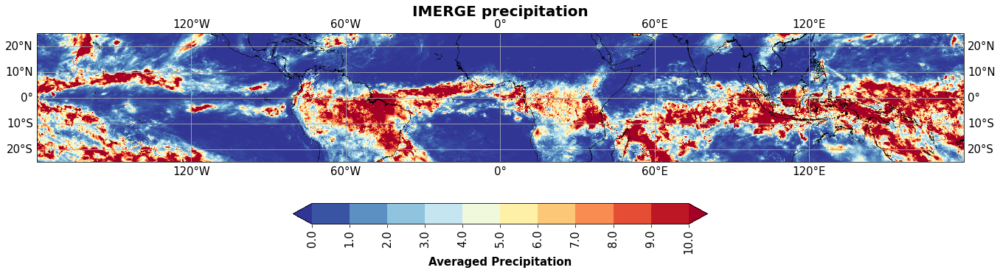

In [82]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000']
for i in range(3):
    contf_tmean(f'IMERGE precipitation',imerge_timavg_mon_data.sel(time=time_idx[i]),'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

# NGC2 RESULT

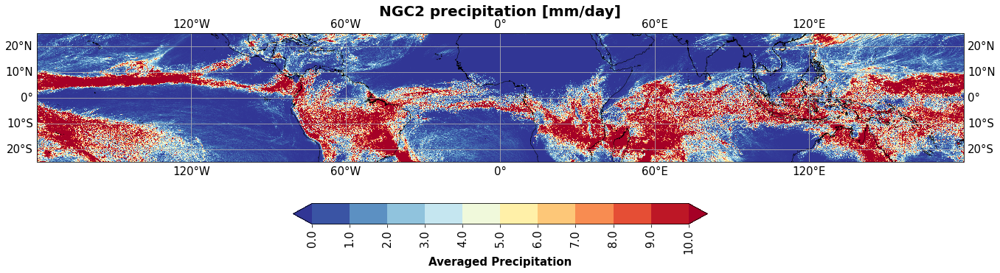

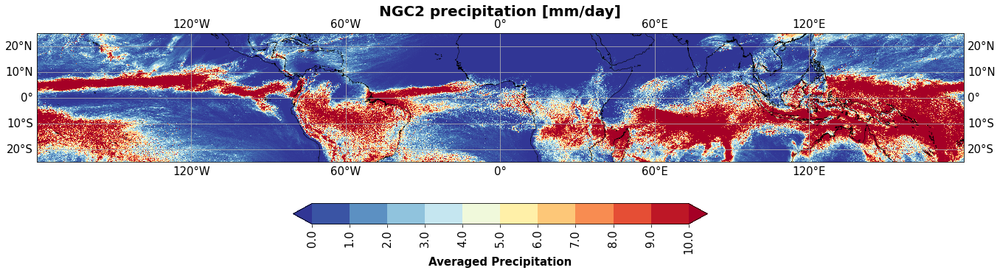

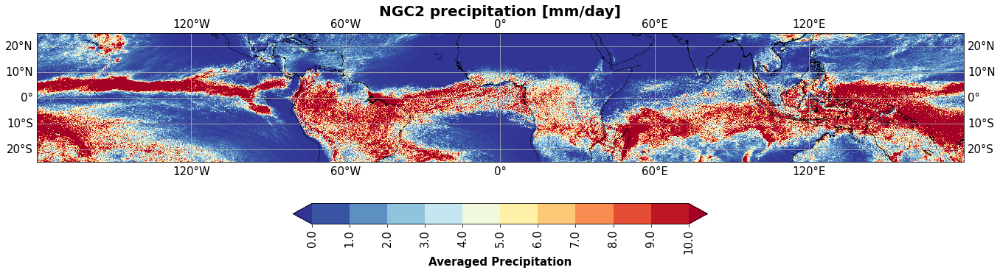

In [76]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000']
for i in range(3):
    contf_tmean(f'NGC2 precipitation [mm/day]',ngc2_timavg_mon.sel(time=time_idx[i]),'Averaged Precipitation','RdYlBu_r',
    0, 10, 11,-30,30,-180,180)

# ICON-IMERGE RESULT: change xarray into numpy by 'values' to maching each other

## Plotting function for difference

In [27]:
def contf_diff(title, data, colormap, varmin, varmax, space):
    lats = icon_timavg.lat
    lons = icon_timavg.lon

    fig = plt.figure(figsize=[18,12],facecolor='w')
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-175,175,-30,30])
    ax.coastlines('50m',linewidth=0.8)
    grid_lines = ax.gridlines(draw_labels=True)
    grid_lines.xformatter = LONGITUDE_FORMATTER
    grid_lines.yformatter = LATITUDE_FORMATTER

    m = ax.pcolormesh(lons,lats,data,cmap=colormap,vmin=varmin,vmax=varmax,transform=ccrs.PlateCarree())
    cbar = plt.colorbar(m,fraction=0.01, pad=0.04,extend='both')
    cbar_ticks = np.linspace(varmin, varmax, num=space)
    cbar.set_ticks(cbar_ticks)
    ax.set_title(title,y=1.1,fontsize=20,fontweight='bold')
    plt.show()

## 1) Time averaged difference for the whole period 

In [ ]:
#imerge_timavg_data=imerge_timavg_data.values
np.shape(imerge_timavg_data)

In [91]:
icon_timavg = icon_timavg.values
np.shape(icon_timavg)

(600, 3600)

In [ ]:
min_precip=icon_timavg-imerge_timavg_data
print(np.shape(min_precip))

In [ ]:
min_precip=icon_timavg-imerge_timavg_data
print(np.shape(min_precip))

In [ ]:
lats = imerge_timavg.lat
lons = imerge_timavg.lon

fig = plt.figure(figsize=[18,12],facecolor='w')
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-175,175,-30,30])
ax.coastlines('50m',linewidth=0.8)
grid_lines = ax.gridlines(draw_labels=True)
grid_lines.xformatter = LONGITUDE_FORMATTER
grid_lines.yformatter = LATITUDE_FORMATTER
m = ax.pcolormesh(lons,lats,min_precip,cmap='RdYlBu',vmin=-20,vmax=20,transform=ccrs.PlateCarree())
plt.colorbar(m,fraction=0.01, pad=0.04,extend='both')
ax.set_title('ICON-IMERGE',y=1.1,fontsize=20,fontweight='bold')
plt.show()

In [ ]:
contf_diff('ICON-IMERGE Precipitation [mm/day]', min_precip, 'RdYlBu_r', -20, 20, 11)

## 2) Monthly averaged

In [ ]:
# change xarray into numpy by values
icon_timavg_mon = icon_timavg_mon.values
imerge_timavg_mon_data = imerge_timavg_mon_data.values

print(np.shape(icon_timavg_mon),np.shape(imerge_timavg_mon_data))

In [ ]:
min_precip_mon = icon_timavg_mon - imerge_timavg_mon_data

In [ ]:
# difference btw imerge and icon
for i in range(3):
    contf_diff(f'ICON-IMERGE precipitation',min_precip_mon[i,:,:],'RdYlBu_r', -20, 20, 11)

In [ ]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Mean Tropical Precipitation 30S-30N JAN-MAR 2020', size=20)
icon_spaiavg.plot.line(label="ICON")
imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Precipitation [mm/day]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
#plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

In [ ]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Amazon Precipitation 65W-55W,10S-EQ', size=20)
icon_spaiavg_amz.plot.line(label="ICON")
imerge_spaiavg_data_amz.plot.line(label="IMERGE")
plt.ylabel('Precipitation [mm/day]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
#plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# ICON-NGC2 RESULT: change xarray into numpy by 'values' to maching each other

## 1) Time averaged difference for the whole period 

In [71]:
icon_timavg_data = icon_timavg.values
ngc2_timavg_data = ngc2_timavg.values
icon_ngc2_precip = icon_timavg_data-ngc2_timavg_data

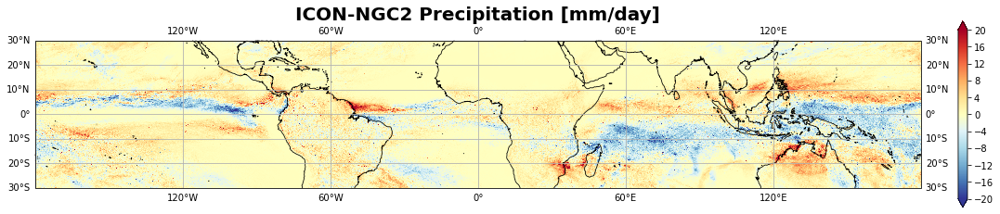

In [72]:
contf_diff('ICON-NGC2 Precipitation [mm/day]', icon_ngc2_precip, 'RdYlBu_r', -20, 20, 11)

In [87]:
#imerge_timavg_data = imerge_timavg_data.values
#imerge_ngc2_precip = imerge_timavg_data-ngc2_timavg_data
imerge_ngc2_precip = ngc2_timavg_data-imerge_timavg_data

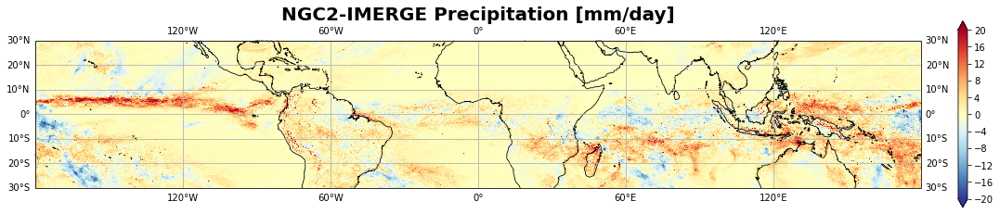

In [88]:
contf_diff('NGC2-IMERGE Precipitation [mm/day]', imerge_ngc2_precip, 'RdYlBu_r', -20, 20, 11)

## 2) Monthly averaged

In [73]:
# change xarray into numpy by values
icon_timavg_mon_data = icon_timavg_mon.values
ngc2_timavg_mon_data = ngc2_timavg_mon.values

In [74]:
icon_ngc2_precip_mon = icon_timavg_mon_data - ngc2_timavg_mon_data

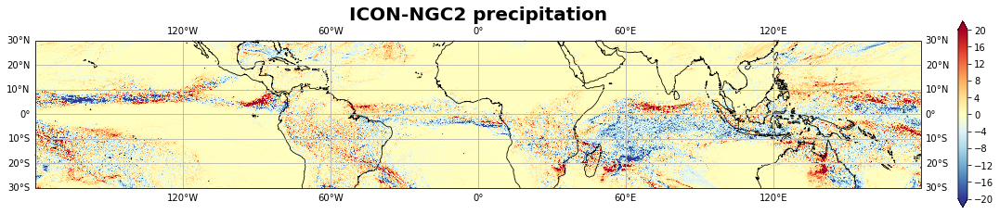

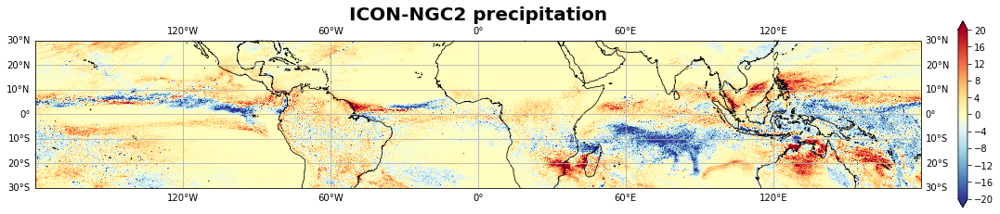

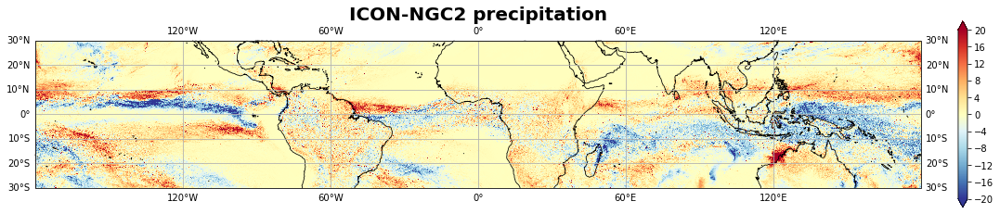

In [75]:
# difference btw ngc2 and icon
for i in range(3):
    contf_diff(f'ICON-NGC2 precipitation',icon_ngc2_precip_mon[i,:,:],'RdYlBu_r', -20, 20, 11)

In [83]:
imerge_timavg_mon_data = imerge_timavg_mon_data.values

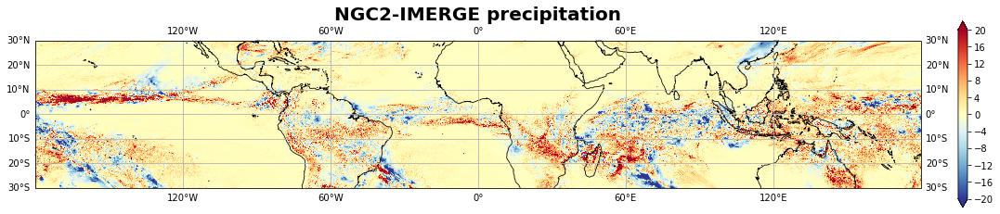

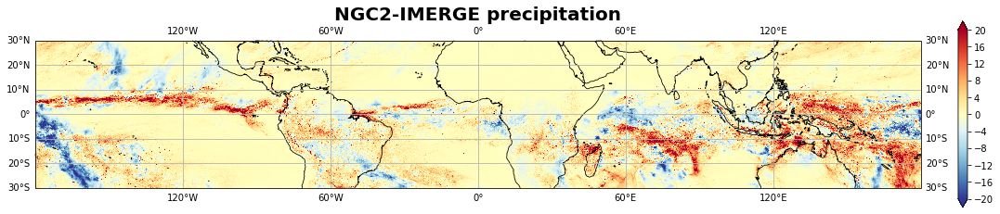

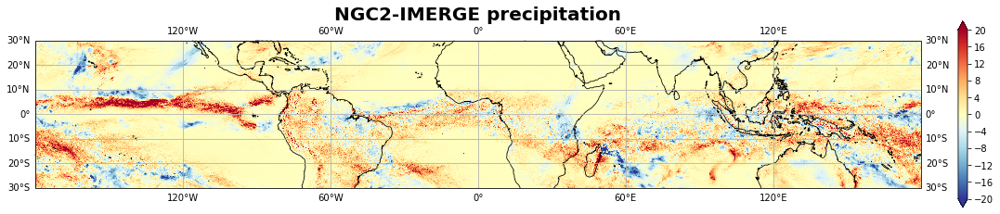

In [89]:
imerge_ngc2_precip_mon = ngc2_timavg_mon_data - imerge_timavg_mon_data
# difference btw ngc2 and icon
for i in range(3):
    contf_diff(f'NGC2-IMERGE precipitation',imerge_ngc2_precip_mon[i,:,:],'RdYlBu_r', -20, 20, 11)

# Zonal mean of Precipitation

In [ ]:
# Amazon: (lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))
# South Indian ocean: (lon=slice(90,180)).mean("lon")

In [145]:
dset_icon

<xarray.DataArray 'pr' (time: 63, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(63, 600, 3600), dtype=float32, chunksize=(24, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-22
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

In [160]:
## both land and ocean
pr_icon_zonal=dset_icon.sel(lon=slice(90,180)).mean(("lon"))
pr_img_zonal=dset_img_jfm.sel(lon=slice(90,180)).mean(("lon"))
pr_ngc2_zonal=dset_ngc2.sel(lon=slice(90,180)).mean(("lon"))

In [173]:
## only over the ocean
dset_icon_mask = dset_icon.where(dset_mask_10km.isel(time=0)==100,0)
dset_ngc2_mask = dset_ngc2.where(dset_mask_10km.isel(time=0)==100,0)
#dset_img_mask = dset_img_jfm.where(dset_mask_10km.isel(time=0)==100,np.nan)

pr_ocn_icon_zonal=dset_icon_mask.sel(lon=slice(90,180)).mean(("lon"))
#pr_ocn_img_zonal=dset_img_mask.sel(lon=slice(-65,-55)).mean(("lon"))
pr_ocn_ngc2_zonal=dset_ngc2_mask.sel(lon=slice(90,180)).mean(("lon"))

In [174]:
## only over the land
dset_icon_mask = dset_icon.where(dset_mask_10km.isel(time=0)!=100,0)
dset_ngc2_mask = dset_ngc2.where(dset_mask_10km.isel(time=0)!=100,0)
#dset_img_mask = dset_img_jfm.where(dset_mask_10km.isel(time=0)==100,np.nan)

pr_lnd_icon_zonal=dset_icon_mask.sel(lon=slice(90,180)).mean(("lon"))
#pr_ocn_img_zonal=dset_img_mask.sel(lon=slice(-65,-55)).mean(("lon"))
pr_lnd_ngc2_zonal=dset_ngc2_mask.sel(lon=slice(90,180)).mean(("lon"))

In [161]:
## both land and ocean
pr_icon_zonal_mon=pr_icon_zonal.resample(time='1M').mean("time")
pr_img_zonal_mon=pr_img_zonal.resample(time='1M').mean("time")
pr_ngc2_zonal_mon=pr_ngc2_zonal.resample(time='1M').mean("time")

pr_icon_zonal_mon=pr_icon_zonal_mon*3600*24
pr_ngc2_zonal_mon=pr_ngc2_zonal_mon*3600*24
pr_img_zonal_mon = pr_img_zonal_mon['calibrated_precipitation'] 

In [175]:
## only over the ocean
pr_ocn_icon_zonal_mon=pr_ocn_icon_zonal.resample(time='1M').mean("time")
#pr_img_zonal_mon=pr_img_zonal.resample(time='1M').mean("time")
pr_ocn_ngc2_zonal_mon=pr_ocn_ngc2_zonal.resample(time='1M').mean("time")

pr_ocn_icon_zonal_mon=pr_ocn_icon_zonal_mon*3600*24
pr_ocn_ngc2_zonal_mon=pr_ocn_ngc2_zonal_mon*3600*24
#pr_ocn_img_zonal_mon = pr_ocn_img_zonal_mon['calibrated_precipitation'] 

In [176]:
## only over the land 
pr_lnd_icon_zonal_mon=pr_lnd_icon_zonal.resample(time='1M').mean("time")
#pr_img_zonal_mon=pr_img_zonal.resample(time='1M').mean("time")
pr_lnd_ngc2_zonal_mon=pr_lnd_ngc2_zonal.resample(time='1M').mean("time")

pr_lnd_icon_zonal_mon=pr_lnd_icon_zonal_mon*3600*24
pr_lnd_ngc2_zonal_mon=pr_lnd_ngc2_zonal_mon*3600*24
#pr_ocn_img_zonal_mon = pr_ocn_img_zonal_mon['calibrated_precipitation'] 

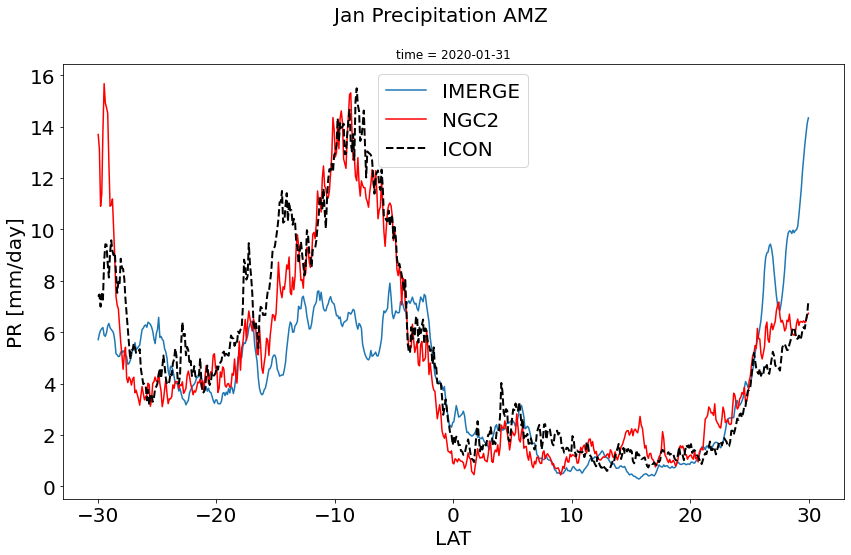

In [142]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Jan Precipitation AMZ', size=20)

pr_img_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="IMERGE")
pr_ngc2_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="NGC2",c='red')
pr_icon_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="ICON",linewidth=2, ls='--',c='black')

#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('PR [mm/day]',fontsize=20)
plt.xlabel('LAT',fontsize=20)
#plt.ylim(295,302)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

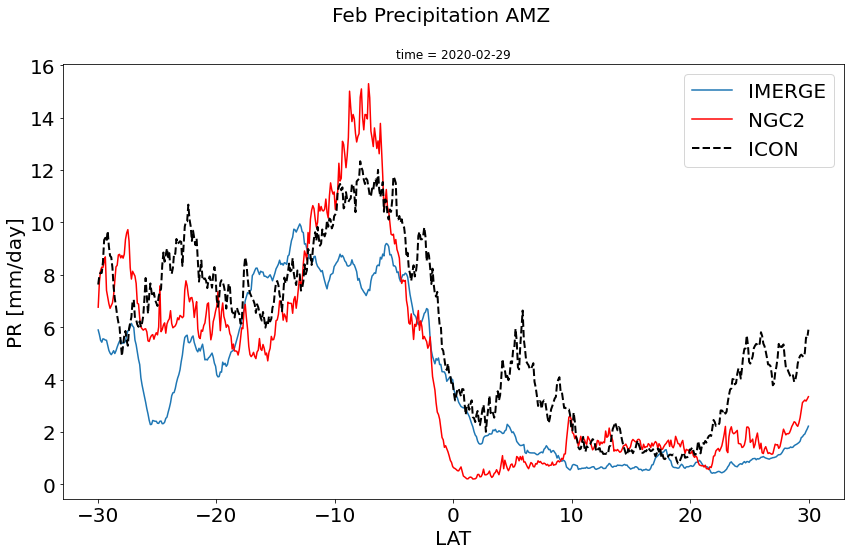

In [143]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Feb Precipitation AMZ', size=20)

pr_img_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="IMERGE")
pr_ngc2_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="NGC2",c='red')
pr_icon_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="ICON",linewidth=2, ls='--',c='black')

#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('PR [mm/day]',fontsize=20)
plt.xlabel('LAT',fontsize=20)
#plt.ylim(295,302)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

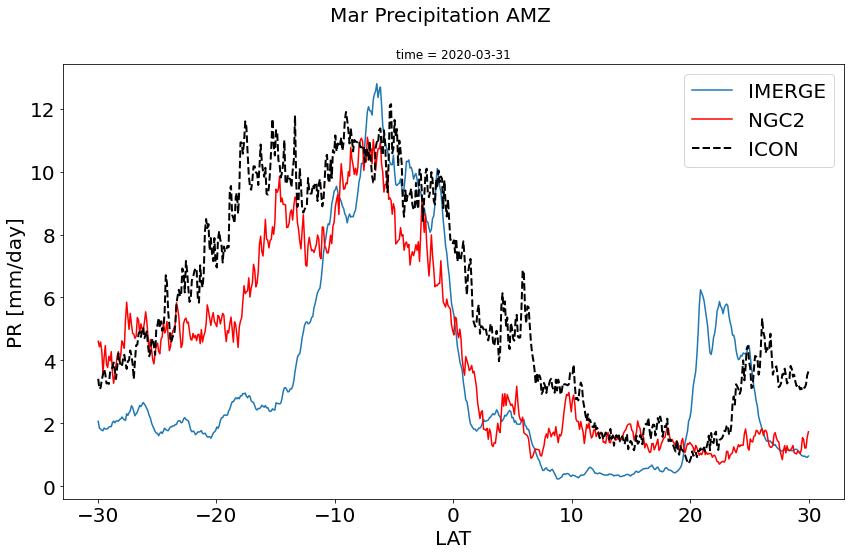

In [144]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Mar Precipitation AMZ', size=20)

pr_img_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="IMERGE")
pr_ngc2_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="NGC2",c='red')
pr_icon_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="ICON",linewidth=2, ls='--',c='black')

#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('PR [mm/day]',fontsize=20)
plt.xlabel('LAT',fontsize=20)
#plt.ylim(295,302)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# over the ocean only

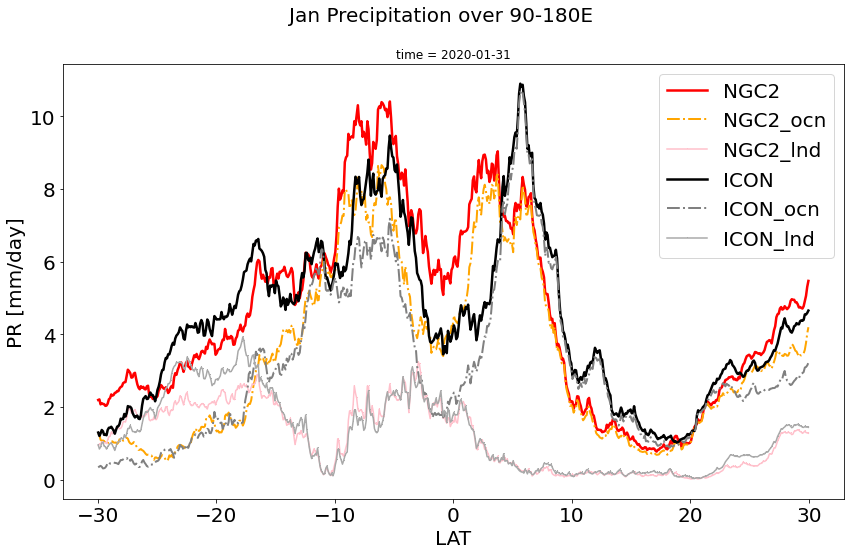

In [185]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Jan Precipitation over 90-180E', size=20)

#pr_img_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="IMERGE")
pr_ngc2_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="NGC2",c='red',linewidth=2.5)
pr_ocn_ngc2_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="NGC2_ocn",c='orange',ls='-.',linewidth=2)
pr_lnd_ngc2_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="NGC2_lnd",c='pink',marker=',')

pr_icon_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="ICON",linewidth=2.5,c='black')
pr_ocn_icon_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="ICON_ocn", ls='-.',c='gray',linewidth=2)
pr_lnd_icon_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="ICON_lnd",marker=',',c='darkgray')

#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('PR [mm/day]',fontsize=20)
plt.xlabel('LAT',fontsize=20)
#plt.ylim(295,302)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

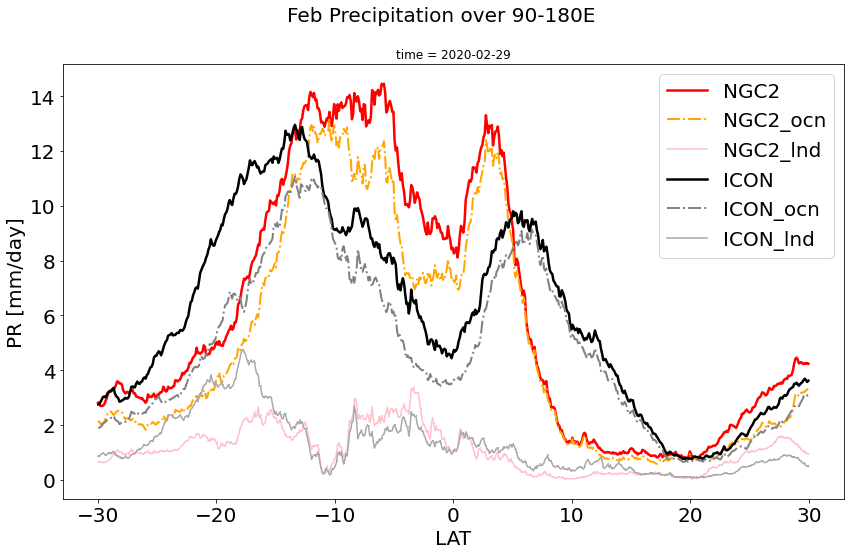

In [186]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Feb Precipitation over 90-180E', size=20)

#pr_img_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="IMERGE")
pr_ngc2_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="NGC2",c='red',linewidth=2.5)
pr_ocn_ngc2_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="NGC2_ocn",c='orange',ls='-.',linewidth=2)
pr_lnd_ngc2_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="NGC2_lnd",c='pink',marker=',')

pr_icon_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="ICON",linewidth=2.5,c='black')
pr_ocn_icon_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="ICON_ocn", ls='-.',c='gray',linewidth=2)
pr_lnd_icon_zonal_mon.sel(time='2020-02-29T00:00:00.000000000').plot.line(label="ICON_lnd",marker=',',c='darkgray')

#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('PR [mm/day]',fontsize=20)
plt.xlabel('LAT',fontsize=20)
#plt.ylim(295,302)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

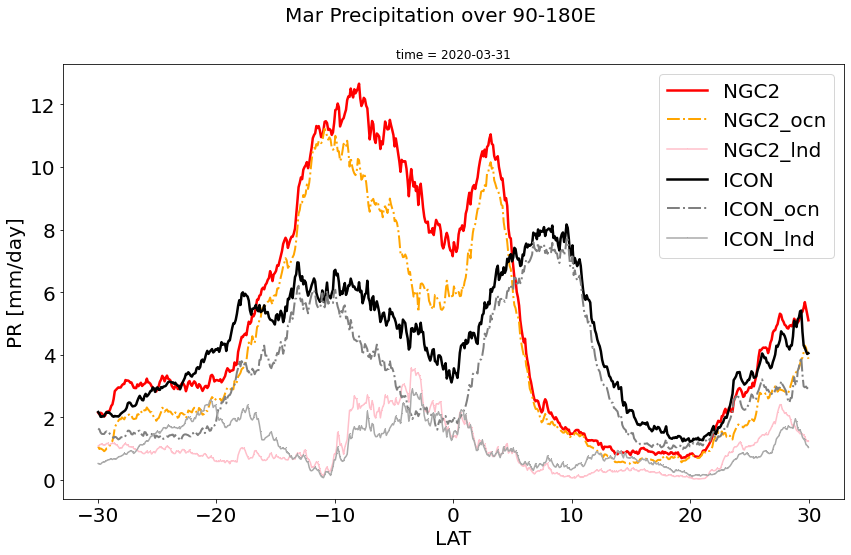

In [187]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Mar Precipitation over 90-180E', size=20)

#pr_img_zonal_mon.sel(time='2020-01-31T00:00:00.000000000').plot.line(label="IMERGE")
pr_ngc2_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="NGC2",c='red',linewidth=2.5)
pr_ocn_ngc2_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="NGC2_ocn",c='orange',ls='-.',linewidth=2)
pr_lnd_ngc2_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="NGC2_lnd",c='pink',marker=',')

pr_icon_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="ICON",linewidth=2.5,c='black')
pr_ocn_icon_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="ICON_ocn", ls='-.',c='gray',linewidth=2)
pr_lnd_icon_zonal_mon.sel(time='2020-03-31T00:00:00.000000000').plot.line(label="ICON_lnd",marker=',',c='darkgray')

#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('PR [mm/day]',fontsize=20)
plt.xlabel('LAT',fontsize=20)
#plt.ylim(295,302)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# SST plotting

## Masking file load: first, use cdo to convert ncells into lat, lon (spent too much time on this...:(!)
### 5km, 10km

In [96]:
# 5km for input SST [ICON 5km to 10km to match the IMERGE]
file_mask_5km = '/work/mh0731/m300948/dpp_0066/bc_land_phys_regrid.nc'
dset_5km = xr.open_dataset(file_mask_5km)
var_names = ['lai_clim']
dset_mask_5km = dset_5km[var_names].persist()
dset_mask_5km

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:144: SerializationWarning: Ambiguous reference date string: 1-1-1. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:673: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/core/indexing.py:423: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime

<xarray.Dataset>
Dimensions:   (time: 12, lat: 3600, lon: 7200)
Coordinates:
  * time      (time) object 0001-01-31 00:00:00 ... 0001-12-31 00:00:00
  * lon       (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat       (lat) float64 -89.95 -89.9 -89.85 -89.8 ... 89.85 89.9 89.95 90.0
Data variables:
    lai_clim  (time, lat, lon) float64 ...
Attributes: (12/16)
    CDI:                          Climate Data Interface version 1.9.10 (http...
    Conventions:                  CF-1.0
    institution:                  Max Planck Institute for Meteorology
    title:                        initial surface data for JSBACH
    refyear_for_cover_types:      2015
    refyear_for_cover_fractions:  2015
    ...                           ...
    references:                   Hagemann, S. & Stacke, T. (2015): Impact of...
    cdo_openmp_thread_number:     8
    history_of_appended_files:    Mon Aug 30 12:40:34 2021: Appended file gau...
    history:                      Tue May 10 14:43:30 2022: cdo -remap,gridde...
    NCO:                          4.6.7
    CDO:                          Climate Data Operators version 1.9.10 (http...

In [97]:
dset_5km

<xarray.Dataset>
Dimensions:               (time: 12, lon: 7200, lat: 3600)
Coordinates:
  * time                  (time) object 0001-01-31 00:00:00 ... 0001-12-31 00...
  * lon                   (lon) float64 -179.9 -179.9 -179.8 ... 180.0 180.0
  * lat                   (lat) float64 -89.95 -89.9 -89.85 ... 89.9 89.95 90.0
Data variables:
    lai_clim              (time, lat, lon) float64 ...
    veg_fract             (time, lat, lon) float64 ...
    roughness_length      (lat, lon) float64 ...
    roughness_length_oro  (lat, lon) float64 ...
    albedo                (lat, lon) float64 ...
    albedo_veg_vis        (lat, lon) float64 ...
    albedo_veg_nir        (lat, lon) float64 ...
    albedo_soil_vis       (lat, lon) float64 ...
    albedo_soil_nir       (lat, lon) float64 ...
    forest_fract          (lat, lon) float64 ...
Attributes: (12/16)
    CDI:                          Climate Data Interface version 1.9.10 (http...
    Conventions:                  CF-1.0
    institution:                  Max Planck Institute for Meteorology
    title:                        initial surface data for JSBACH
    refyear_for_cover_types:      2015
    refyear_for_cover_fractions:  2015
    ...                           ...
    references:                   Hagemann, S. & Stacke, T. (2015): Impact of...
    cdo_openmp_thread_number:     8
    history_of_appended_files:    Mon Aug 30 12:40:34 2021: Appended file gau...
    history:                      Tue May 10 14:43:30 2022: cdo -remap,gridde...
    NCO:                          4.6.7
    CDO:                          Climate Data Operators version 1.9.10 (http...

In [2]:
# 10km for output SST [ICON 5km to 10km to match the IMERGE]
file_mask_10km = '/work/mh0731/m300948/dpp_0066/bc_land_phys_regrid_1x1.nc'
dset_nc_10km = nc.Dataset(file_mask_10km, mode='r')

# convert nc.dataset to xr.dataset
dset_xr_10km = xr.open_dataset(xr.backends.NetCDF4DataStore(dset_nc_10km))

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:144: SerializationWarning: Ambiguous reference date string: 1-1-1. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:673: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/core/indexing.py:423: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime

In [99]:
dset_mask_5km=dset_mask_5km.sel(lat=slice(-30,30))

In [3]:
dset_mask_10km=dset_xr_10km.sel(lat=slice(-30,30))

In [4]:
dset_mask_10km

<xarray.Dataset>
Dimensions:               (time: 12, lon: 3600, lat: 600)
Coordinates:
  * time                  (time) object 0001-01-31 00:00:00 ... 0001-12-31 00...
  * lon                   (lon) float64 -179.9 -179.8 -179.8 ... 179.9 180.0
  * lat                   (lat) float64 -29.95 -29.85 -29.75 ... 29.85 29.95
Data variables:
    lai_clim              (time, lat, lon) float64 ...
    veg_fract             (time, lat, lon) float64 ...
    roughness_length      (lat, lon) float64 ...
    roughness_length_oro  (lat, lon) float64 ...
    albedo                (lat, lon) float64 ...
    albedo_veg_vis        (lat, lon) float64 ...
    albedo_veg_nir        (lat, lon) float64 ...
    albedo_soil_vis       (lat, lon) float64 ...
    albedo_soil_nir       (lat, lon) float64 ...
    forest_fract          (lat, lon) float64 ...
Attributes: (12/16)
    CDI:                          Climate Data Interface version 2.0.3 (https...
    Conventions:                  CF-1.0
    institution:                  Max Planck Institute for Meteorology
    title:                        initial surface data for JSBACH
    refyear_for_cover_types:      2015
    refyear_for_cover_fractions:  2015
    ...                           ...
    references:                   Hagemann, S. & Stacke, T. (2015): Impact of...
    cdo_openmp_thread_number:     8
    history_of_appended_files:    Mon Aug 30 12:40:34 2021: Appended file gau...
    history:                      Fri Jul 08 17:54:27 2022: cdo -remap,gridde...
    NCO:                          4.6.7
    CDO:                          Climate Data Operators version 2.0.3 (https...

In [101]:
dset_mask_5km=dset_mask_5km['lai_clim']

In [5]:
dset_mask_10km=dset_mask_10km['lai_clim']

In [103]:
# nan to 100 ==> reference data to mask the other dataset
dset_mask_5km=dset_mask_5km.fillna(100)

In [6]:
dset_mask_10km=dset_mask_10km.fillna(100)

In [7]:
dset_mask_10km

<xarray.DataArray 'lai_clim' (time: 12, lat: 600, lon: 3600)>
array([[[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
...
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]]])
Coordinates:
  * time     (time) object 0001-01-31 00:00:00 ... 0001-12-31 00:00:00
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
Attributes:
    long_name:  leaf area index
    units:

## 1) SST input (5KM, 10km remapped one to compare)

In [8]:
# 5km
#file_sst_in = '/work/mh0731/m300948/AMDEF/SST/modified_test_remapbil.nc'
# 10km remapped
file_sst_in = '/work/mh0731/m300948/AMDEF/SST/modified_test_remapbil.nc'
dset_sst_in = xr.open_dataset(file_sst_in) # if it is ncfile
var_names = ['tosbcs']
subset_sst_in = dset_sst_in[var_names].persist()
subset_sst_in

<xarray.Dataset>
Dimensions:  (time: 12, lat: 1800, lon: 3600)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -89.95 -89.85 -89.75 -89.65 ... 89.75 89.85 89.95
Data variables:
    tosbcs   (time, lat, lon) float32 ...
Attributes: (12/35)
    CDI:                     Climate Data Interface version 2.0.3 (https://mp...
    source:                  PCMDI-AMIP 1.1.2: Merged SST based on UK MetOffi...
    institution:             Program for Climate Model Diagnosis and Intercom...
    Conventions:             CF-1.7 CMIP-6.0
    history:                 Wed Aug 03 14:22:54 2022: cdo remapbil,mygrid ./...
    activity_id:             input4MIPs
    ...                      ...
    title:                   PCMDI-AMIP 1.1.2 dataset prepared for input4MIPs
    tracking_id:             47a09332-8f0e-4d97-9ba4-c437c14cf89c
    variable_id:             tosbcs
    license:                 AMIP boundary condition data produced by PCMDI i...
    cmor_version:            3.2.3
    CDO:                     Climate Data Operators version 2.0.3 (https://mp...

In [9]:
subset_sst_in=subset_sst_in.sel(lat=slice(-30,30))
sst_input=subset_sst_in['tosbcs']

In [15]:
# matching the latitude same between masking file and input date
sst_input['lat'] = dset_mask_10km['lat']

In [16]:
# mask 'sst_input' with 'dset_mask'
sst_input_mask=sst_input.where(dset_mask_10km.isel(time=0)==100,np.nan)

In [17]:
sst_input_mask

<xarray.DataArray 'tosbcs' (time: 12, lat: 600, lon: 3600)>
array([[[296.28928, 296.28867, 296.2887 , ..., 296.29803, 296.2938 ,
         296.29138],
        [296.32013, 296.31946, 296.31958, ..., 296.33228, 296.32693,
         296.32138],
        [296.34454, 296.34702, 296.35416, ..., 296.36514, 296.35782,
         296.34717],
        ...,
        [292.36768, 292.37366, 292.3867 , ..., 292.3948 , 292.38492,
         292.37018],
        [292.3296 , 292.3302 , 292.33176, ..., 292.3437 , 292.33685,
         292.3299 ],
        [292.28125, 292.282  , 292.28342, ..., 292.29025, 292.28506,
         292.28287]],

       [[296.91333, 296.9129 , 296.91306, ..., 296.92188, 296.91766,
         296.91534],
        [296.94537, 296.94492, 296.94525, ..., 296.95728, 296.95197,
         296.94644],
        [296.9707 , 296.97363, 296.98135, ..., 296.9912 , 296.9839 ,
         296.97318],
...
        [296.07715, 296.07654, 296.0822 , ..., 296.11304, 296.1007 ,
         296.08334],
        [296.04562, 296.04214, 296.04016, ..., 296.0692 , 296.05984,
         296.0499 ],
        [296.00623, 296.0032 , 296.00128, ..., 296.0239 , 296.01645,
         296.01126]],

       [[295.06256, 295.06287, 295.06375, ..., 295.0699 , 295.06583,
         295.064  ],
        [295.0985 , 295.09872, 295.09967, ..., 295.10977, 295.10443,
         295.09897],
        [295.12686, 295.13098, 295.14035, ..., 295.14792, 295.1403 ,
         295.129  ],
        ...,
        [294.30344, 294.30856, 294.32022, ..., 294.3296 , 294.32013,
         294.30606],
        [294.26816, 294.2685 , 294.26978, ..., 294.28192, 294.27536,
         294.26868],
        [294.22345, 294.22403, 294.22525, ..., 294.23206, 294.22717,
         294.22504]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Constructed mid-month Sea Surface Temperature
    units:          degC
    cell_methods:   time: point
    cell_measures:  area: areacello

### total average (1 value)

In [ ]:
# average the whole tropical area
#sst_input_tavg = sst_input.sel(time=slice('2020-01-16T12:00:00.000000000','2020-04-16T12:00:00.000000000')).mean(("time","lat","lon"))

# average only for the ocean
sst_input_tavg_ocn = sst_input.where(dset_mask_5km.isel(time=0)==100).sel(time=slice('2020-01-16T12:00:00.000000000','2020-04-16T12:00:00.000000000')).mean(("time","lat","lon"))

In [ ]:
#print(sst_input_tavg)
print(sst_input_tavg_ocn)

In [ ]:
sst_input_time_avg=sst_input.sel(time=slice('2020-01-16T12:00:00.000000000','2020-04-16T12:00:00.000000000')).mean("time")

In [ ]:
sst_input_time_avg

In [ ]:
# mask 'sst_input' with 'dset_mask'
sst_input_time_avg_mask=sst_input_time_avg.where(dset_mask_5km.isel(time=0)==100,np.nan)

## Plot SST

In [ ]:
time_idx = ['2020-01-16T12:00:00.000000000', '2020-02-15T12:00:00.000000000',
       '2020-03-16T12:00:00.000000000','2020-04-16T00:00:00.000000000']
for i in range(4):   
    contf_tmean(f'Climatology SST input',sst_input_mask.sel(time=time_idx[i]),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
contf_tmean(f'Averaged Climatology SST input',sst_input_time_avg_mask,'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
a=sst_input_time_avg-sst_input_tavg
print(a.max())
print(a.min())

In [ ]:
contf_tmean(f'Climatology SST input perturbation',sst_input_time_avg_mask-sst_input_tavg_ocn,'SST','RdYlBu_r',-20,20, 41,-30,30,-180,180)

## 2) SST output + Surface temperature (10KM)

In [18]:
# ts
path_icon =Path('/scratch/m/m300948/test_04/')
glob_pattern = 'test_daily_ts_2020'
file_icon = sorted([str(f) for f in path_icon.glob(f'{glob_pattern}*.nc')])[:]
var = 'ts'
sst_icon = xr.open_mfdataset(file_icon,parallel=True)[var].chunk({'time':24})

In [19]:
# TIME AVERAGE
sst_icon=sst_icon.sel(lat=slice(-30,30)).resample(time='1M').mean("time")

In [20]:
# SPATIAL AVERAGE
sst_icon=sst_icon.sel(lat=slice(-30,30))

In [21]:
# mask 'sst_input' with 'dset_mask'
sst_icon_mask=sst_icon.where(dset_mask_10km.isel(time=0)==100,np.nan)

In [22]:
sst_icon_mask

<xarray.DataArray 'ts' (time: 2, lat: 600, lon: 3600)>
dask.array<where, shape=(2, 600, 3600), dtype=float32, chunksize=(1, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

In [26]:
sst_input_mask

<xarray.DataArray 'tosbcs' (time: 12, lat: 600, lon: 3600)>
array([[[296.28928, 296.28867, 296.2887 , ..., 296.29803, 296.2938 ,
         296.29138],
        [296.32013, 296.31946, 296.31958, ..., 296.33228, 296.32693,
         296.32138],
        [296.34454, 296.34702, 296.35416, ..., 296.36514, 296.35782,
         296.34717],
        ...,
        [292.36768, 292.37366, 292.3867 , ..., 292.3948 , 292.38492,
         292.37018],
        [292.3296 , 292.3302 , 292.33176, ..., 292.3437 , 292.33685,
         292.3299 ],
        [292.28125, 292.282  , 292.28342, ..., 292.29025, 292.28506,
         292.28287]],

       [[296.91333, 296.9129 , 296.91306, ..., 296.92188, 296.91766,
         296.91534],
        [296.94537, 296.94492, 296.94525, ..., 296.95728, 296.95197,
         296.94644],
        [296.9707 , 296.97363, 296.98135, ..., 296.9912 , 296.9839 ,
         296.97318],
...
        [296.07715, 296.07654, 296.0822 , ..., 296.11304, 296.1007 ,
         296.08334],
        [296.04562, 296.04214, 296.04016, ..., 296.0692 , 296.05984,
         296.0499 ],
        [296.00623, 296.0032 , 296.00128, ..., 296.0239 , 296.01645,
         296.01126]],

       [[295.06256, 295.06287, 295.06375, ..., 295.0699 , 295.06583,
         295.064  ],
        [295.0985 , 295.09872, 295.09967, ..., 295.10977, 295.10443,
         295.09897],
        [295.12686, 295.13098, 295.14035, ..., 295.14792, 295.1403 ,
         295.129  ],
        ...,
        [294.30344, 294.30856, 294.32022, ..., 294.3296 , 294.32013,
         294.30606],
        [294.26816, 294.2685 , 294.26978, ..., 294.28192, 294.27536,
         294.26868],
        [294.22345, 294.22403, 294.22525, ..., 294.23206, 294.22717,
         294.22504]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Constructed mid-month Sea Surface Temperature
    units:          degC
    cell_methods:   time: point
    cell_measures:  area: areacello

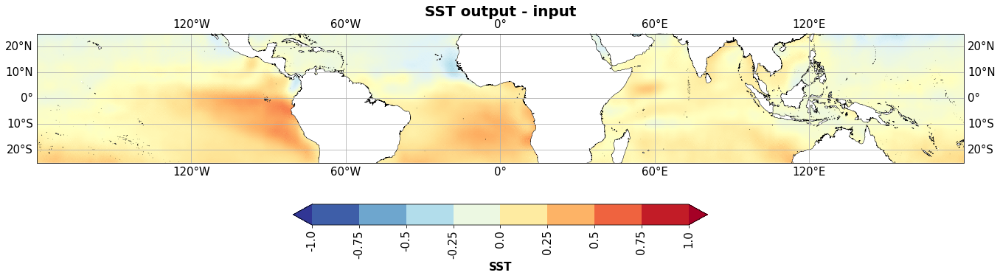

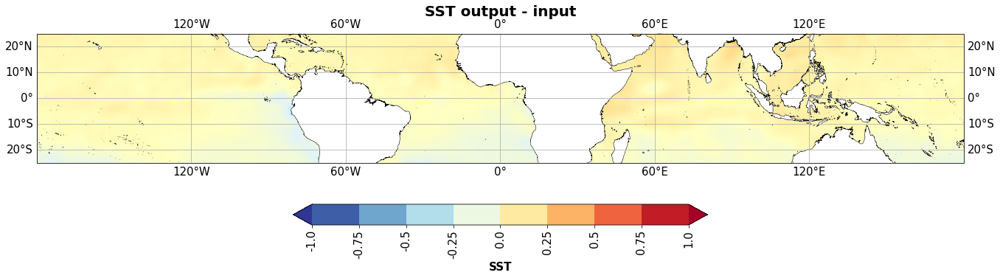

In [37]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000']
      #'2020-03-31T00:00:00.000000000','2020-04-30T00:00:00.000000000']
for i in range(2):   
    #contf_tmean(f'SST output - input',sst_icon_mask.isel(time=time_idx[i])-sst_input_mask.isel(time=time_idx[i]),'SST',
    contf_tmean(f'SST output - input',sst_icon_mask.isel(time=i)-sst_input_mask.isel(time=i),'SST',
    'RdYlBu_r',-1,1, 9,-30,30,-180,180)

In [ ]:
for i in range(3):   
    contf_tmean(f'SST output',sst_icon_mask.isel(time=i),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
contf_tmean(f'SST output',sst_icon_mask.isel(time=1)-sst_icon_mask.isel(time=0),'SST','RdYlBu_r',-5,5, 11,-30,30,-180,180)

In [ ]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000','2020-04-30T00:00:00.000000000']
for i in range(4):   
    contf_tmean(f'SST output',sst_icon_mask.sel(time=time_idx[i]),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
contf_tmean(f'SST output',sst_icon_mask.isel(time=31)-sst_icon_mask.isel(time=0),'SST','RdYlBu_r',-0.5,0.5,11,-30,30,-180,180)

### total average (1 value) 

In [ ]:
# average only for the ocean => one value
sst_icon_tavg_ocn = sst_icon_mask.mean(("time"))

In [ ]:
sst_icon_tavg_ocn

In [ ]:
a=sst_icon_tavg_ocn.to_numpy()
b=np.nanmean(a, axis=(0,1))

In [ ]:
b

In [ ]:
contf_tmean(f'Averaged Climatology SST input',sst_icon_tavg_ocn,'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
contf_tmean(f'Climatology SST input perturbation',sst_icon_tavg_ocn-b,'SST','RdYlBu_r',-20,20, 41,-30,30,-180,180)

# ICON SST for the first step

In [ ]:
file_sst_rg_in = '/work/mh0731/m300948/nextgems_cycle2_1/experiments/TEST01/work/run_20200120T000000-20200120T235920/TEST01_atm_2d_ml_20200120T000000Z_regrid.nc'
dset_sst_rg_in = xr.open_dataset(file_sst_rg_in) # if it is ncfile
var_names = ['ts']
subset_sst_rg_in = dset_sst_rg_in[var_names]
subset_sst_rg_in

In [ ]:
sst_rg_in=subset_sst_rg_in.sel(lat=slice(-30,30))

In [ ]:
# mask 'sst_input' with 'dset_mask'
sst_rg_in_mask=sst_rg_in.where(dset_mask_5km.isel(time=0)==100,np.nan)

In [ ]:
sst_rg_in_mask=sst_rg_in_mask['ts']
#sst_input=subset_sst_in['tosbcs']

In [ ]:
contf_tmean(f'SST for the 1st step',sst_rg_in_mask.isel(time=0),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

## Test with re-regrid data

In [ ]:
new_sst_rg_in = '/work/mh0731/m300948/AMDEF/SST/new_regrid_2020.nc'
new_sst_rg_in = xr.open_dataset(new_sst_rg_in) # if it is ncfile
var_names = ['tosbcs']
new_sst_rg_in = new_sst_rg_in[var_names]
new_sst_rg_in

In [ ]:
new_sst_rg_in=new_sst_rg_in.sel(lat=slice(-30,30))

In [ ]:
# mask 'sst_input' with 'dset_mask'
new_sst_rg_in_mask=new_sst_rg_in.where(dset_mask_5km.isel(time=0)==100,np.nan)

In [ ]:
new_sst_rg_in_mask=new_sst_rg_in_mask['tosbcs']

In [ ]:
new_sst_rg_in_mask

In [ ]:
contf_tmean(f'SST for the 1st step',new_sst_rg_in_mask.isel(time=0),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
contf_tmean(f'SST for the 2nd step',new_sst_rg_in_mask.isel(time=1),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
contf_tmean(f'SST for the 3rd step',new_sst_rg_in_mask.isel(time=2),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

## Time series of SST (Spatial average)

In [ ]:
sst_input

In [ ]:
sstin_trop_spaiavg = sst_input_mask.mean(("lon", "lat"))

In [ ]:
sstin_trop_spaiavg_1 = np.full(12,299.18793)
sstin_trop_spaiavg_2 = np.full(29,299.33652)
sstin_trop_spaiavg_final = np.concatenate((sstin_trop_spaiavg_1, sstin_trop_spaiavg_2))

In [ ]:
da

In [ ]:
sstout_trop_spaiavg = sst_icon_mask.mean(("lon", "lat"))
sstout_amz_spaiavg = sst_icon_mask.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

In [ ]:
time = pd.date_range("2020-01-20", periods=41)
da = xr.DataArray(
     data=sstin_trop_spaiavg_final,
     dims=["time"],
     coords=dict(
         time=time,
     ),
     attrs=dict(
         description="SST",
         units="K",
     ),
 )

In [ ]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Tropical SST 30S-30N JAN-MAR 2020', size=20)
sstout_trop_spaiavg[0:].plot.line(label="out_SST")
da[0:].plot.line(label="in_SST")
#plt.plot(sstin_trop_spaiavg_final[0:], label="in_SST")
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(298,301)
plt.xlim([datetime.date(2020, 1, 20),datetime.date(2020, 2, 29)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

In [ ]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Tropical Temperature 30S-30N JAN-MAR 2020', size=20)
era5_trop_spaiavg[0:].plot.line(label="ERA5_TP")
icon_trop_spaiavg[0:].plot.line(label="ICON_TP")
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(295,302)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# 2m Temperature

## Load interpolated ICON results

In [3]:
path_icon =Path('/scratch/m/m300948/test_04/')
glob_pattern = 'test_daily_tas_2020'
file_icon = sorted([str(f) for f in path_icon.glob(f'{glob_pattern}*.nc')])[:61]

In [4]:
var = 'tas'
dset_tas = xr.open_mfdataset(file_icon,parallel=True)[var].chunk({'time':24})

In [5]:
dset_tas

<xarray.DataArray 'tas' (time: 61, height_2: 1, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(61, 1, 600, 3600), dtype=float32, chunksize=(24, 1, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-20
  * lon       (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat       (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
  * height_2  (height_2) float64 2.0

### 1-1) Time average

In [ ]:
icon_timavg = dset_tas.sel(height_2=2.0).mean("time").compute() 

In [13]:
icon_mon_timavg = dset_tas.sel(height_2=2.0).resample(time='1M').mean("time").compute() 

In [14]:
icon_mon_timavg

<xarray.DataArray 'tas' (time: 3, lat: 600, lon: 3600)>
array([[[295.13113, 295.1388 , 295.1478 , ..., 295.11453, 295.11783,
         295.12094],
        [295.17935, 295.1907 , 295.20078, ..., 295.14865, 295.15524,
         295.16458],
        [295.22687, 295.23947, 295.2504 , ..., 295.18185, 295.1901 ,
         295.2041 ],
        ...,
        [290.5047 , 290.50812, 290.5124 , ..., 290.50955, 290.5025 ,
         290.50104],
        [290.41495, 290.42307, 290.4293 , ..., 290.41644, 290.41595,
         290.41452],
        [290.3307 , 290.33792, 290.34256, ..., 290.32803, 290.3275 ,
         290.32617]],

       [[296.49826, 296.5097 , 296.51865, ..., 296.48752, 296.48853,
         296.49014],
        [296.56012, 296.5701 , 296.57672, ..., 296.53366, 296.53836,
         296.5487 ],
        [296.6168 , 296.6205 , 296.62936, ..., 296.59283, 296.59598,
         296.60843],
...
        [290.5081 , 290.51233, 290.51926, ..., 290.52386, 290.51395,
         290.5107 ],
        [290.4377 , 290.44147, 290.44424, ..., 290.446  , 290.44202,
         290.44052],
        [290.37692, 290.38116, 290.38327, ..., 290.3657 , 290.3686 ,
         290.3722 ]],

       [[296.56024, 296.56674, 296.5677 , ..., 296.56876, 296.56522,
         296.55844],
        [296.61734, 296.6211 , 296.6211 , ..., 296.61752, 296.6118 ,
         296.61044],
        [296.6696 , 296.67242, 296.6768 , ..., 296.67078, 296.66434,
         296.66373],
        ...,
        [290.88098, 290.87457, 290.8726 , ..., 290.91058, 290.89597,
         290.8869 ],
        [290.80133, 290.79083, 290.78116, ..., 290.8267 , 290.8195 ,
         290.81128],
        [290.72083, 290.70978, 290.70053, ..., 290.74286, 290.73602,
         290.72772]]], dtype=float32)
Coordinates:
  * time      (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31
  * lon       (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat       (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
    height_2  float64 2.0

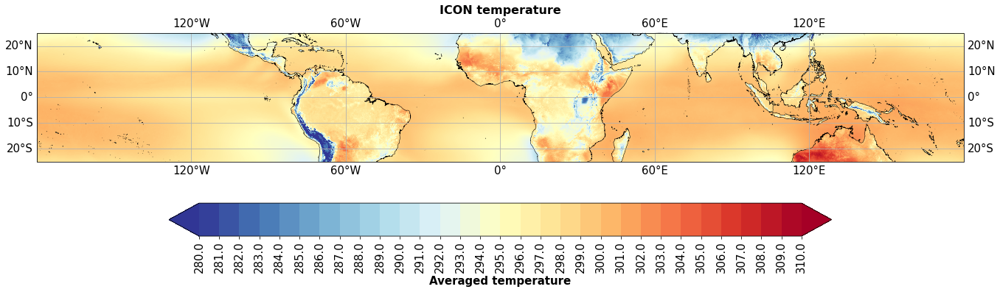

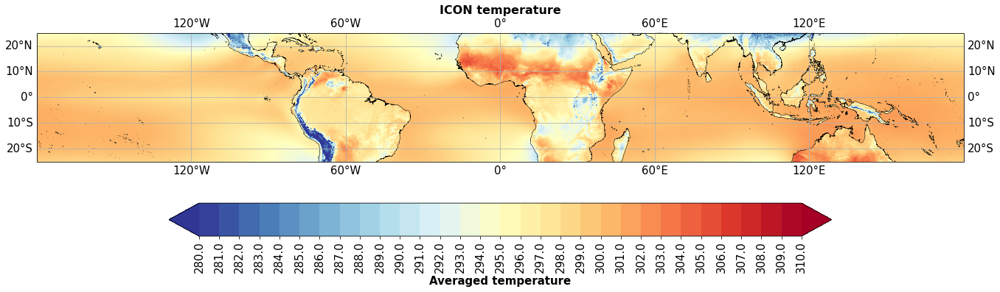

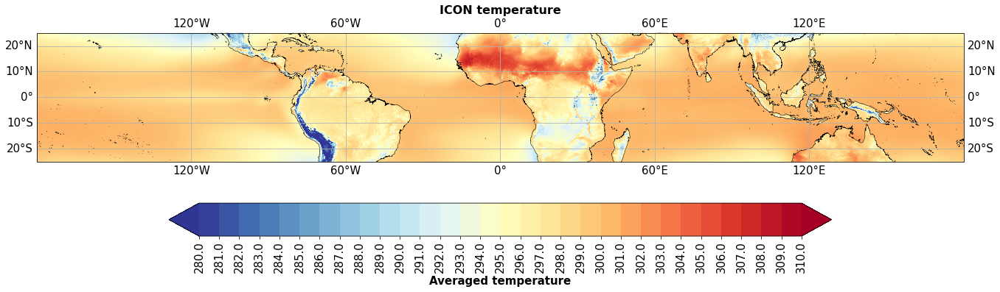

In [74]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
for i in range(3):
    contf_tmean(f'ICON temperature',icon_mon_timavg.isel(time=i),'Averaged temperature','RdYlBu_r',280, 310, 31,-30,30,-180,180)

## Load NEXTGEMC2

In [10]:
path_ngc2 =Path('/scratch/m/m300948/nextgem_cyc2/')
glob_pattern = 'ngc2002_daily_tas_2020'
file_ngc2 = sorted([str(f) for f in path_ngc2.glob(f'{glob_pattern}*.nc')])[:61]

In [11]:
var = 'tas'
dset_ngc2_tas = xr.open_mfdataset(file_ngc2,parallel=True)[var].chunk({'time':24})

In [12]:
dset_ngc2_tas

<xarray.DataArray 'tas' (time: 59, height: 1, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(59, 1, 600, 3600), dtype=float32, chunksize=(24, 1, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-23
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
  * height   (height) float64 2.0

In [16]:
ngc2_mon_timavg = dset_ngc2_tas.sel(height=2.0).resample(time='1M').mean("time").compute() 

## Load MODIS 
### Land surface temperature

In [ ]:
# Terra land surface temperature
path_terra =Path('/pool/data/ICDC/land/modis_terra_landsurfacetemperature/DATA/DAILY/2020')
glob_pattern = 'MODIS-C061__MOD11C1__DAILY__LandSurfaceTemperature__0.05deg__UHAM-ICDC__2020'
file_terra = sorted([str(f) for f in path_terra.glob(f'{glob_pattern}*.nc')])[:]

# 2020.01.20.00:00 - 2020.03.31.23:30 24*182-1
file_terra_date=file_terra[19:31+29+31+20]
var = ['lst_day','lst_night']

dset_terra = xr.open_mfdataset(file_terra_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)

# after modifying data, if I want to upload in real then use [].load() 

In [ ]:
# Aqua
path_aqua =Path('/pool/data/ICDC/land/modis_aqua_landsurfacetemperature/DATA/DAILY/2020')
glob_pattern = 'MODIS-C061__MYD11C1__DAILY__LandSurfaceTemperature__0.05deg__UHAM-ICDC__2020'
file_aqua = sorted([str(f) for f in path_aqua.glob(f'{glob_pattern}*.nc')])[:]

# 2020.01.20.00:00 - 2020.03.31.23:30 24*182-1
file_aqua_date=file_aqua[19:31+29+31+20]
var = ['lst_day','lst_night']

#dset_aqua = xr.open_mfdataset(file_aqua_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)
dset_aqua = xr.open_mfdataset(file_aqua_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)

# after modifying data, if I want to upload in real then use [].load() 

In [ ]:
dset_terra

In [ ]:
dset_aqua

### Averaging daytime and nighttime to get averaged daily temperature

In [ ]:
dset_terra_daily = (dset_terra['lst_day']+dset_terra['lst_night'])/2
dset_aqua_daily = (dset_aqua['lst_day']+dset_aqua['lst_night'])/2

### Average terra and aqua to get a representative value for the one day

In [ ]:
dset_modis_daily = (dset_terra_daily+dset_aqua_daily)/2

In [ ]:
dset_modis_daily

In [ ]:
modis_daily=dset_modis_daily.sel(lat=slice(30,-30))

In [ ]:
modis_mon_avg = modis_daily.resample(time='1M').mean("time")

In [ ]:
modis_mon_avg

In [ ]:
modis_mon_avg=modis_mon_avg.coarsen(lon=2).mean().coarsen(lat=2).mean()

In [ ]:
modis_mon_avg

## Monthly mean

In [ ]:
terra_mon_timavg = dset_terra.resample(time='1M').mean("time")
aqua_mon_timavg = dset_aqua.resample(time='1M').mean("time")

In [ ]:
terra_timavg = dset_terra.mean("time")
aqua_timavg = dset_aqua.mean("time")

# Plotting tas

## 1) ICON TAS

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'ICON Averaged 2m Temperature',modis_daily.isel(time=0),'Temp [K]','RdYlBu_r',280, 310, 31,-30,30,-180,180)

In [ ]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000'] #,'2020-04-30T00:00:00.000000000']
for i in range(3):   
    contf_tmean(f'ICON 2m Temperature',icon_mon_timavg.sel(time=time_idx[i]),'Temp [K]','RdYlBu_r',280, 310, 31,-30,30,-180,180)

## 2) MODIS

### 2-1) Terra

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'TERRA Averaged 2m Temperature',modis_mon_avg,'Temp [K]','RdYlBu_r',21, 41, 61,30,-30,-180,180)

### 2-2) Aqua

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'AQUA Averaged 2m Temperature',aqua_timavg,'Temp [K]','RdYlBu_r',21, 41, 61,-30,30,-180,180)

In [ ]:
modis_mon_avg

In [ ]:
modis_mon_avg=modis_mon_avg.reindex(lat=list(reversed(modis_mon_avg.lat)))

In [ ]:
modis_mon_avg_int=modis_mon_avg.interpolate_na(dim="lat", method="cubic", fill_value="extrapolate")

In [ ]:
modis_mon_avg_int=modis_mon_avg_int.chunk(dict(lon=-1))
modis_mon_avg_int=modis_mon_avg_int.interpolate_na(dim="lon", method="cubic", fill_value="extrapolate")

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg.isel(time=0),'Temp [K]','RdYlBu_r',20, 40, 21,-30,30,-180,180)

In [ ]:
modis_mon_avg_int

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=0),'Temp [K]','RdYlBu_r',20, 40, 21,-30,30,-180,180)

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=1),'Temp [K]','RdYlBu_r',20, 40, 21,25,-25,-180,180)

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=2),'Temp [K]','RdYlBu_r',20, 40, 21,25,-25,-180,180)

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=3),'Temp [K]','RdYlBu_r',20, 40, 21,25,-25,-180,180)

## 3) ERA5 TAS (T2m)

In [30]:
file_era5 ='/scratch/m/m300948/ERA5/ERA5_2020_var167_remapbil.nc'
dset_era5 = xr.open_dataset(file_era5) # if it is ncfile

In [31]:
dset_era5

<xarray.Dataset>
Dimensions:  (time: 366, lon: 3600, lat: 1800)
Coordinates:
  * time     (time) float64 2.02e+07 2.02e+07 2.02e+07 ... 2.02e+07 2.02e+07
  * lon      (lon) float64 -180.0 -179.9 -179.8 -179.7 ... 179.7 179.8 179.9
  * lat      (lat) float64 -89.78 -89.68 -89.58 -89.48 ... 89.92 90.02 90.12
Data variables:
    var167   (time, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.3 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    institution:  European Centre for Medium-Range Weather Forecasts
    history:      Wed Aug 03 11:12:10 2022: cdo remapbil,mygrid ./ERA5_2020_v...
    CDO:          Climate Data Operators version 2.0.3 (https://mpimet.mpg.de...

In [32]:
# Date in the ERA5 needs to be converted into format of 'date'
date=pd.date_range("2020-01-01", periods=366)
dset_era5['time']=date

In [33]:
#dset_era5_date=dset_era5.isel(time=slice(19,31+29+31+20)).sel(lat=slice(30,-30))
dset_era5_date=dset_era5.sel(time=slice('2020-01-20T00:00:00.000000000','2020-03-22T00:00:00.000000000')).sel(lat=slice(-30,30))

In [34]:
dset_era5_date

<xarray.Dataset>
Dimensions:  (time: 63, lon: 3600, lat: 600)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-22
  * lon      (lon) float64 -180.0 -179.9 -179.8 -179.7 ... 179.7 179.8 179.9
  * lat      (lat) float64 -29.98 -29.88 -29.78 -29.68 ... 29.72 29.82 29.92
Data variables:
    var167   (time, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.3 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    institution:  European Centre for Medium-Range Weather Forecasts
    history:      Wed Aug 03 11:12:10 2022: cdo remapbil,mygrid ./ERA5_2020_v...
    CDO:          Climate Data Operators version 2.0.3 (https://mpimet.mpg.de...

In [35]:
dset_era5_date = dset_era5_date['var167']

### 1) Time average

In [36]:
era5_mon_timavg = dset_era5_date.resample(time='1M').mean("time")

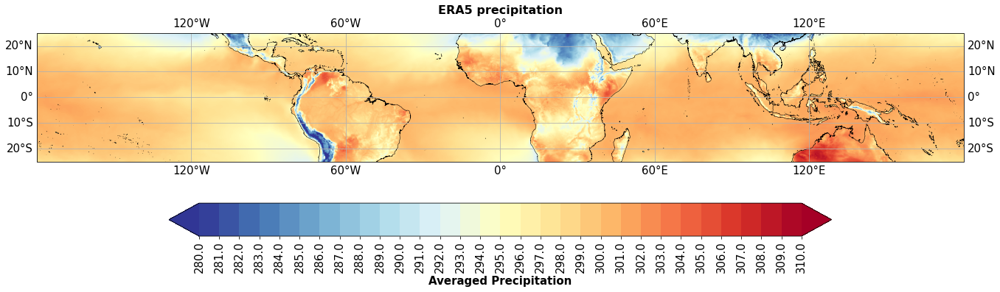

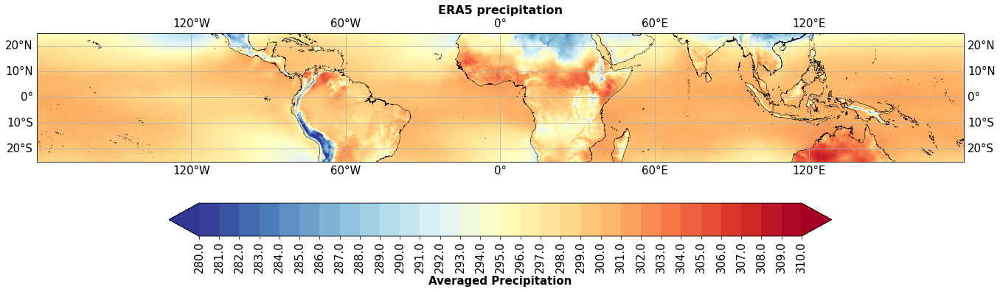

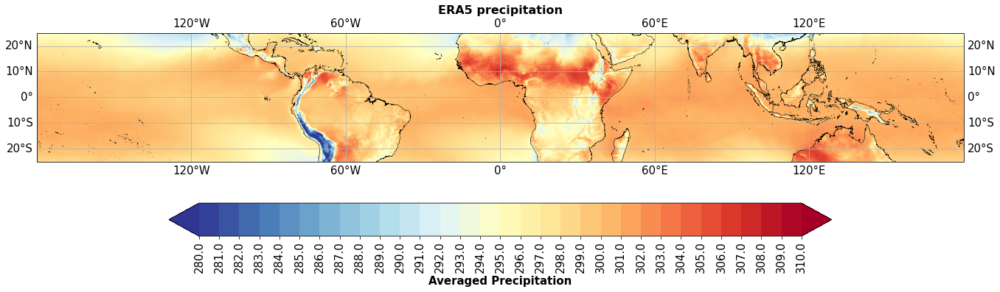

In [56]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
for i in range(3):
    contf_tmean(f'ERA5 precipitation',era5_mon_timavg.isel(time=i),'Averaged Precipitation','RdYlBu_r',280, 310, 31,-30,30,-180,180)

# ICON-ERA5 T2m difference

In [76]:
icon_mon_timavg_data = icon_mon_timavg.values
era5_mon_timavg_data = era5_mon_timavg.values
min_temp=icon_mon_timavg_data-era5_mon_timavg_data

In [77]:
np.shape(min_temp)

(3, 600, 3600)

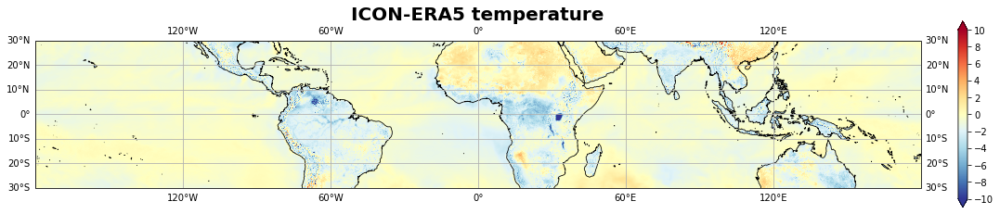

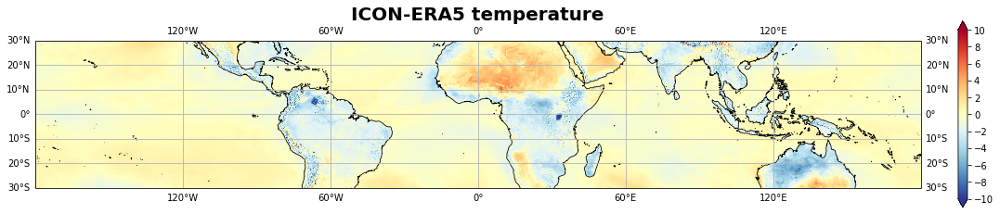

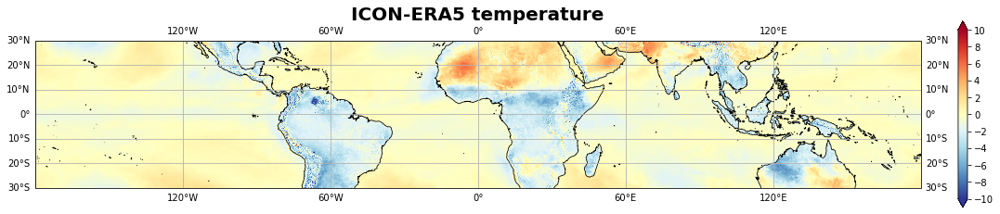

In [78]:
# difference btw imerge and icon
for i in range(3):
    contf_diff(f'ICON-ERA5 temperature',min_temp[i,:,:],'RdYlBu_r', -10, 10, 11)

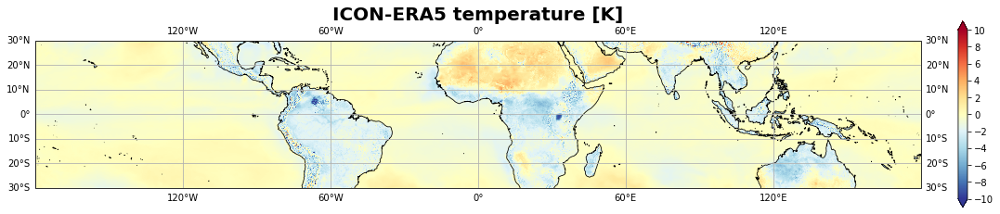

In [88]:
total_min_temp = np.nanmean(min_temp,axis=0)
contf_diff(f'ICON-ERA5 temperature [K]',total_min_temp[:,:],'RdYlBu_r', -10, 10, 11)

# ICON-NGC2 T2m difference

In [18]:
icon_mon_timavg_data = icon_mon_timavg.values
ngc2_mon_timavg_data = ngc2_mon_timavg.values
min_icon_ngc2_temp=icon_mon_timavg_data-ngc2_mon_timavg_data

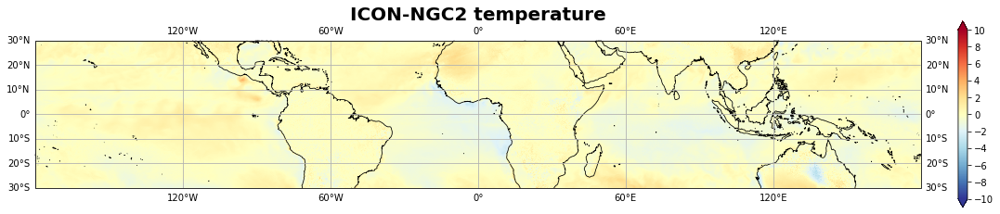

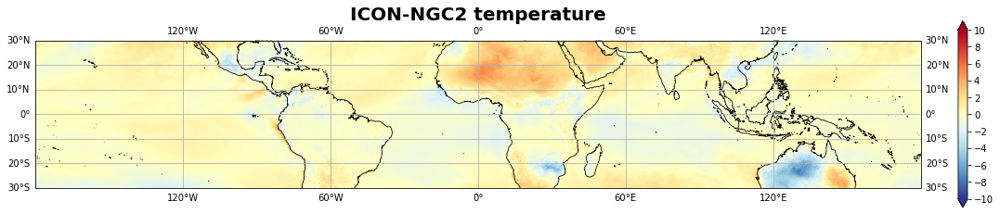

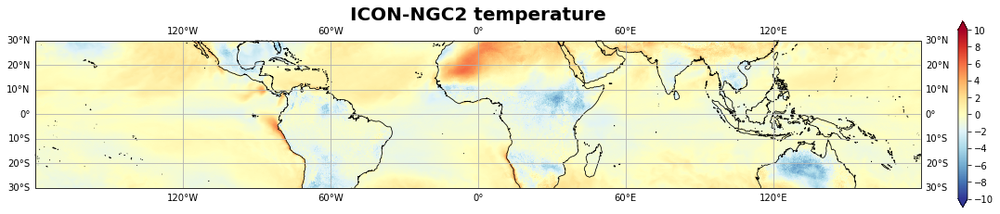

In [28]:
# difference btw imerge and icon
for i in range(3):
    contf_diff(f'ICON-NGC2 temperature',min_icon_ngc2_temp[i,:,:],'RdYlBu_r', -10, 10, 11)

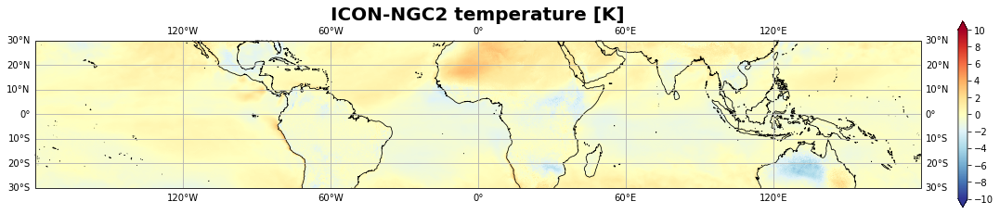

In [63]:
total_min_icon_ngc2_temp = np.nanmean(min_icon_ngc2_temp,axis=0)
contf_diff(f'ICON-NGC2 temperature [K]',total_min_icon_ngc2_temp[:,:],'RdYlBu_r', -10, 10, 11)

# NGC2-ERA5 T2m difference

In [37]:
era5_mon_timavg_data = era5_mon_timavg.values
ngc2_mon_timavg_data = ngc2_mon_timavg.values
min_ngc2_era5_temp=ngc2_mon_timavg_data-era5_mon_timavg_data

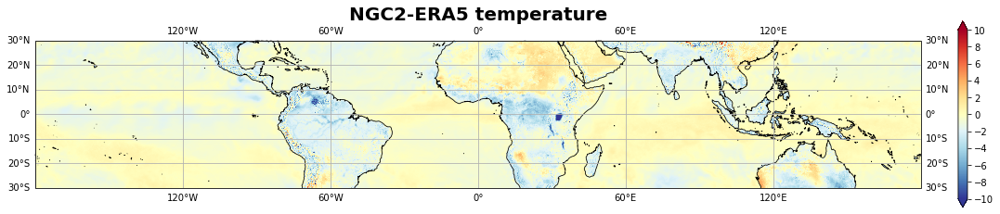

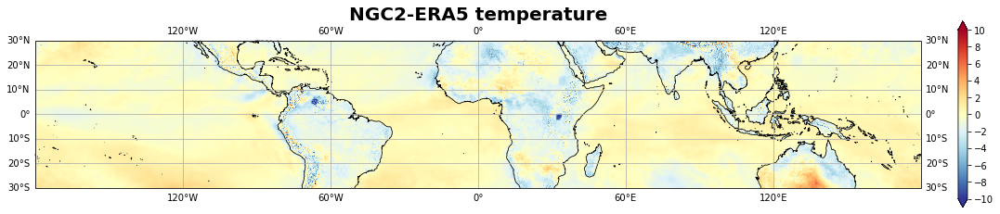

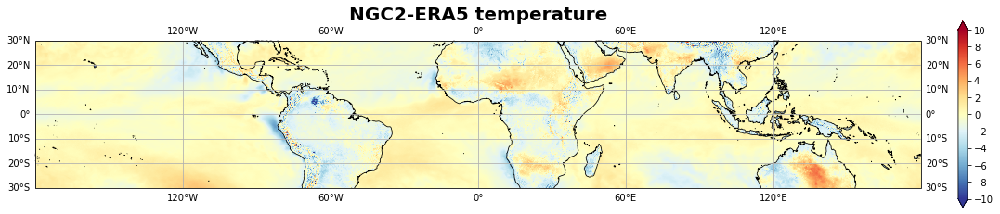

In [38]:
# difference btw imerge and icon
for i in range(3):
    contf_diff(f'NGC2-ERA5 temperature',min_ngc2_era5_temp[i,:,:],'RdYlBu_r', -10, 10, 11)

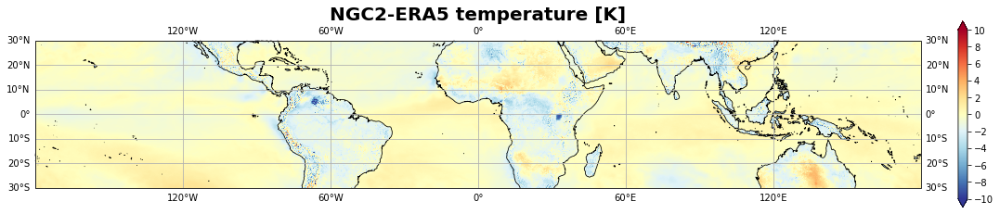

In [39]:
total_min_ngc2_era5_temp = np.nanmean(min_ngc2_era5_temp,axis=0)
contf_diff(f'NGC2-ERA5 temperature [K]',total_min_ngc2_era5_temp[:,:],'RdYlBu_r', -10, 10, 11)

## 1-2) Spatial average

In [40]:
# icon
icon_trop_spaiavg = dset_tas.sel(height_2=2.0).mean(("lon", "lat"))
icon_amz_spaiavg = dset_tas.sel(height_2=2.0).sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

In [44]:
# NGC2
ngc2_trop_spaiavg = dset_ngc2_tas.sel(height=2.0).mean(("lon", "lat"))
ngc2_amz_spaiavg = dset_ngc2_tas.sel(height=2.0).sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

In [42]:
# era5
era5_trop_spaiavg = dset_era5_date.mean(("lon", "lat"))
era5_amz_spaiavg = dset_era5_date.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

In [93]:
print(icon_trop_spaiavg[:].values)

[291.1241  297.30237 297.30505 297.29904 297.24695 297.21136 297.19955
 297.18994 297.17612 297.141   297.14362 297.14517 297.1193  297.0586
 296.969   296.9422  297.00595 297.02463 297.0569  297.13272 297.22342
 297.29984 297.3279  297.34238 297.36072 297.41446 297.49524 297.54706
 297.5518  297.59027 297.61395 297.6511  297.68253 297.68674 297.67447
 297.66882 297.6633  297.64487 297.58286 297.48114 297.4068  297.421
 297.50238 297.53308 297.54053 297.55655 297.58533 297.64154 297.7147
 297.80295 297.84268 297.8546  297.86395 297.81683 297.7347  297.74002
 297.7517  297.72537 297.73273 297.7211  297.7102        inf]


/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


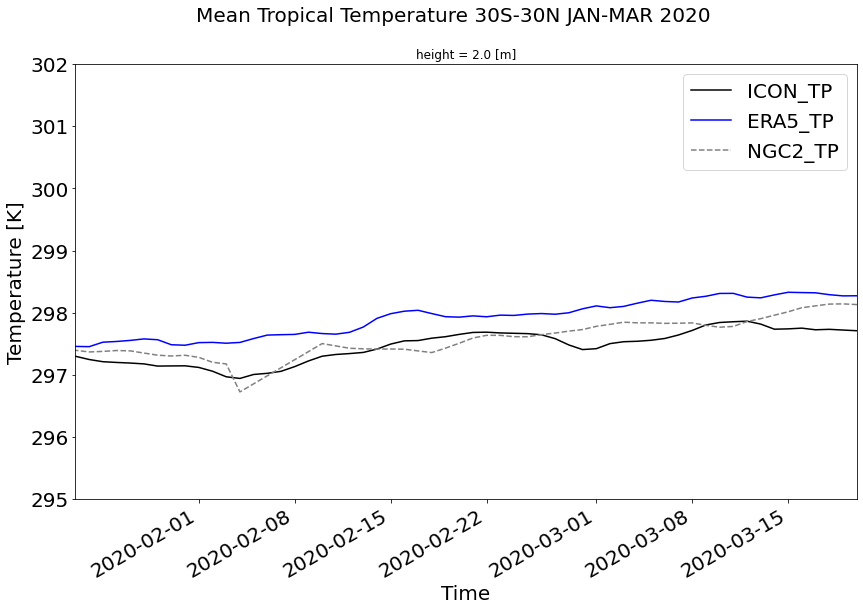

In [45]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Mean Tropical Temperature 30S-30N JAN-MAR 2020', size=20)
icon_trop_spaiavg[0:].plot.line(label="ICON_TP",c='black')
era5_trop_spaiavg[0:].plot.line(label="ERA5_TP",c='blue')
ngc2_trop_spaiavg[0:].plot.line(label="NGC2_TP",c='gray',ls='--')
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(295,302)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 20)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

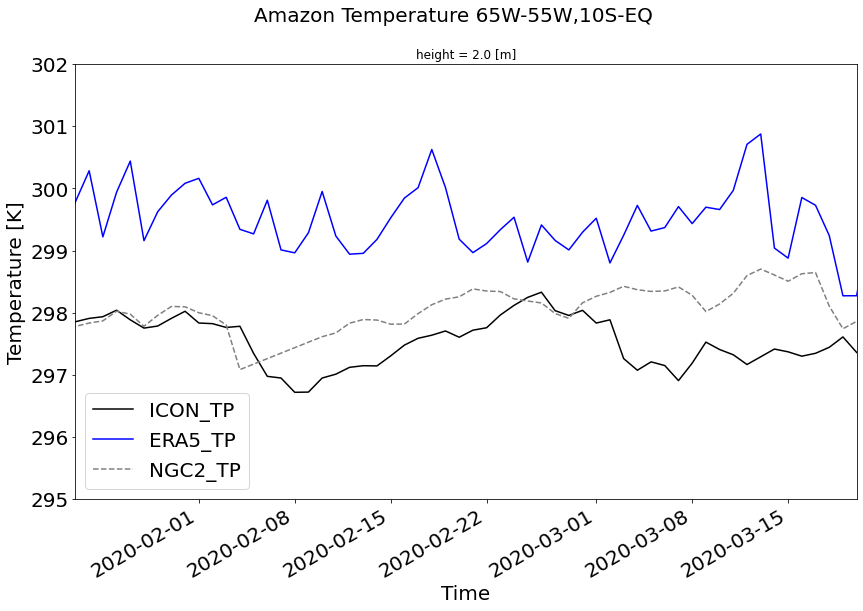

In [46]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Amazon Temperature 65W-55W,10S-EQ', size=20)
icon_amz_spaiavg[0:].plot.line(label="ICON_TP",c='black')
era5_amz_spaiavg[0:].plot.line(label="ERA5_TP",c='blue')
ngc2_amz_spaiavg[0:].plot.line(label="NGC2_TP",c='gray',ls='--')
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(295,302)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 20)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)